In [4]:
# !pip install ydata-profiling

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import math
from sklearn.preprocessing import RobustScaler, LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, r2_score, mean_absolute_error, mean_squared_error

import warnings
warnings.filterwarnings('ignore')
# from ydata_profiling import ProfileReport

In [6]:
pip freeze > requirements.txt

In [7]:

used_libs = [
    "pandas",
    "numpy",
    "matplotlib",
    "seaborn",
    "plotly",
    "scikit-learn",
    "xgboost",
    "tensorflow",
    "ydata-profiling"
]


with open("/content/requirements.txt", "r") as f:
    lines = f.readlines()


filtered = []
for line in lines:
    for lib in used_libs:
        if line.lower().startswith(lib.lower() + "=="):
            filtered.append(line.strip())
            break


with open("/content/requirements.txt", "w") as f:
    f.write("\n".join(filtered))




In [8]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [9]:
df = pd.read_csv("hf://datasets/BoostedJonP/league_of_legends_match_data/league_of_legends_emerald_match_data.csv")

In [10]:
df.head()

,match_id,game_duration,queue_id,champion_id,champion_name,champion_level,champion_experience,champion_skin_id,team_id,team_position,individual_position,role,lane,win,kills,deaths,assists,double_kills,triple_kills,quadra_kills,penta_kills,unreal_kills,largest_killing_spree,largest_multi_kill,killing_sprees,total_damage_dealt,total_damage_dealt_to_champions,total_damage_taken,total_damage_shielded_on_teammates,physical_damage_dealt,physical_damage_dealt_to_champions,physical_damage_taken,magic_damage_dealt,magic_damage_dealt_to_champions,magic_damage_taken,true_damage_dealt,true_damage_dealt_to_champions,true_damage_taken,damage_self_mitigated,gold_earned,gold_spent,items_purchased,consumables_purchased,total_minions_killed,neutral_minions_killed,total_ally_jungle_minions_killed,total_enemy_jungle_minions_killed,vision_score,wards_placed,wards_killed,vision_wards_bought_in_game,detector_wards_placed,sight_wards_bought_in_game,dragon_kills,baron_kills,turret_kills,inhibitor_kills,nexus_kills,turret_takedowns,inhibitor_takedowns,nexus_takedowns,objectives_stolen,objectives_stolen_assists,first_blood_kill,first_blood_assist,first_tower_kill,first_tower_assist,summoner_1_id,summoner_2_id,summoner_1_casts,summoner_2_casts,spell_1_casts,spell_2_casts,spell_3_casts,spell_4_casts,time_played,total_time_spent_dead,total_time_cc_dealt,time_ccing_others,total_heal,total_heals_on_teammates,total_units_healed,effective_heal_and_shielding,largest_critical_strike,longest_time_spent_living,eligible_for_progression,game_ended_in_surrender,game_ended_in_early_surrender,team_early_surrendered,all_in_pings,assist_me_pings,basic_pings,command_pings,danger_pings,enemy_missing_pings,enemy_vision_pings,get_back_pings,hold_pings,need_vision_pings,on_my_way_pings,push_pings,retreat_pings,vision_cleared_pings,rune_primary_style,rune_secondary_style,rune_stat_defense,rune_stat_flex,rune_stat_offense,kda,kill_participation,damage_per_minute,gold_per_minute,vision_score_per_minute,solo_kills,outnumbered_kills,skillshots_hit,skillshots_dodged,wards_guarded,ban_1_champion_id,ban_2_champion_id,ban_3_champion_id,ban_4_champion_id,ban_5_champion_id
0,EUW1_7447926699,1589,420,8,Vladimir,13,10652,0,100,TOP,TOP,SOLO,TOP,False,2,5,1,1,0,0,0,0,2,2,1,97288,21686,25885,0,11719,1854,21032,84822,19281,4241,746,550,612,14111,7309,6950,11,0,154,0,0,0,13,7,1,0,0,0,0,0,0,0,0,0,0,0,0,0,False,False,False,False,6,4,2,2,205,7,65,6,1589,183,76,3,17757,0,1,0,0,758,True,False,False,False,1,11,0,4,0,7,3,0,0,0,5,0,2,0,8200,8000,5011,5008,5007,0.600000,0.142857,818.595014,275.909754,0.512124,0,1,0,8,0,267.0,131.0,78.0,83.0,122.0
1,EUW1_7447926699,1589,420,104,Graves,14,11921,3,100,JUNGLE,JUNGLE,NONE,JUNGLE,False,2,6,7,0,0,0,0,0,0,1,0,219464,10545,27528,0,164564,8517,20176,652,428,6848,54248,1599,503,20052,9711,9550,17,0,33,144,115,2,13,1,4,0,0,0,2,0,0,0,0,0,0,0,0,0,False,False,False,False,11,4,9,2,105,15,45,9,1589,218,464,13,12611,0,1,0,375,754,True,False,False,False,0,10,0,0,0,6,0,0,0,1,3,0,0,0,8100,8000,5001,5008,5005,1.500000,0.428571,398.065700,366.589687,0.510467,0,0,29,13,0,267.0,131.0,78.0,83.0,122.0
2,EUW1_7447926699,1589,420,91,Talon,15,14098,5,100,MIDDLE,MIDDLE,SOLO,MIDDLE,False,12,3,5,1,1,0,0,0,7,3,2,134891,27134,19461,0,128168,24291,9800,0,0,8868,6722,2842,792,10837,11611,11350,24,1,185,6,0,2,16,10,0,0,0,0,1,0,0,0,0,0,0,0,0,0,False,False,False,False,14,4,7,4,67,140,215,14,1589,85,98,5,4684,0,1,0,510,832,True,False,False,False,2,3,0,8,0,3,0,6,0,2,3,0,0,0,8100,8200,5011,5008,5008,5.666667,0.809524,1024.252358,438.300058,0.634948,6,6,66,15,1,267.0,131.0,78.0,83.0,122.0
3,EUW1_7447926699,1589,420,29,Twitch,13,10015,4,100,BOTTOM,BOTTOM,CARRY,BOTTOM,False,3,5,4,0,0,0,0,0,2,1,1,84675,8879,12565,0,73356,6827,8787,0,0,3608,11318,2051,168,6552,10055,10080,24,7,164,4,0,0,24,10,3,6,3,0,0,0,1,0,0,1,0,0,0,0,False,False,True,False,21,4,2,3,24,23,8,6,1589,113,147,6,1324,0,1,0,536,614,True,False,False,False,0,6,0,2,0,2,2,0,0,0,12,0,2,0,8000,8200,5011,5008,5005,1.400000,0.333333,335.178146,

In [11]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24618 entries, 0 to 24617
Data columns (total 123 columns):
 #    Column                              Non-Null Count  Dtype  
---   ------                              --------------  -----  
 0    match_id                            24618 non-null  object 
 1    game_duration                       24618 non-null  int64  
 2    queue_id                            24618 non-null  int64  
 3    champion_id                         24618 non-null  int64  
 4    champion_name                       24618 non-null  object 
 5    champion_level                      24618 non-null  int64  
 6    champion_experience                 24618 non-null  int64  
 7    champion_skin_id                    24618 non-null  int64  
 8    team_id                             24618 non-null  int64  
 9    team_position                       24483 non-null  object 
 10   individual_position                 24618 non-null  object 
 11   role                      

In [12]:
df.describe()

,game_duration,queue_id,champion_id,champion_level,champion_experience,champion_skin_id,team_id,kills,deaths,assists,double_kills,triple_kills,quadra_kills,penta_kills,unreal_kills,largest_killing_spree,largest_multi_kill,killing_sprees,total_damage_dealt,total_damage_dealt_to_champions,total_damage_taken,total_damage_shielded_on_teammates,physical_damage_dealt,physical_damage_dealt_to_champions,physical_damage_taken,magic_damage_dealt,magic_damage_dealt_to_champions,magic_damage_taken,true_damage_dealt,true_damage_dealt_to_champions,true_damage_taken,damage_self_mitigated,gold_earned,gold_spent,items_purchased,consumables_purchased,total_minions_killed,neutral_minions_killed,total_ally_jungle_minions_killed,total_enemy_jungle_minions_killed,vision_score,wards_placed,wards_killed,vision_wards_bought_in_game,detector_wards_placed,sight_wards_bought_in_game,dragon_kills,baron_kills,turret_kills,inhibitor_kills,nexus_kills,turret_takedowns,inhibitor_takedowns,nexus_takedowns,objectives_stolen,objectives_stolen_assists,summoner_1_id,summoner_2_id,summoner_1_casts,summoner_2_casts,spell_1_casts,spell_2_casts,spell_3_casts,spell_4_casts,time_played,total_time_spent_dead,total_time_cc_dealt,time_ccing_others,total_heal,total_heals_on_teammates,total_units_healed,effective_heal_and_shielding,largest_critical_strike,longest_time_spent_living,all_in_pings,assist_me_pings,basic_pings,command_pings,danger_pings,enemy_missing_pings,enemy_vision_pings,get_back_pings,hold_pings,need_vision_pings,on_my_way_pings,push_pings,retreat_pings,vision_cleared_pings,rune_primary_style,rune_secondary_style,rune_stat_defense,rune_stat_flex,rune_stat_offense,kda,kill_participation,damage_per_minute,gold_per_minute,vision_score_per_minute,solo_kills,outnumbered_kills,skillshots_hit,skillshots_dodged,wards_guarded,ban_1_champion_id,ban_2_champion_id,ban_3_champion_id,ban_4_champion_id,ban_5_champion_id
count,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.0,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.0,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.00000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.0,24618.000000,24618.000000,24618.000000,24618.000000,24618.0,24618.000000,24618.0,24618.000000,24618.000000,24618.00000,24618.0,24618.000000,24618.000000,24618.000000,24618.000000,24618.0,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24618.000000,24556.000000,24556.000000,24556.000000,24556.000000,24556.000000
mean,1712.160289,428.686327,202.587497,14.645869,14051.660817,5.011130,150.012186,5.816313,5.837639,7.946746,0.528800,0.066577,0.008246,0.000894,0.0,2.752498,1.320944,1.314648,146631.211471,21187.333049,27550.339101,585.819116,80260.897595,10592.443903,16147.158339,47844.391665,9212.597693,9954.067024,18525.015355,1381.465513,1448.147047,22583.567593,11434.485580,10481.885572,20.528150,3.229385,127.706191,33.475303,19.079576,3.233406,26.363027,11.327931,2.964579,1.538549,1.324925,0.0,0.383947,0.078276,1.128808,0.188399,0.075920,2.082744,0.490779,0.258348,0.026078,0.010683,18.200707,19.813957,5.000609,5.470184,111.984402,58.192989,63.220245,15.55500,1712.160289,176.174060,263.163255,26.040133,9117.227191,709.3953

# **Data preprocessing**

In [13]:
df.duplicated().sum()

np.int64(9200)

In [14]:
df = df.drop_duplicates()

In [15]:
id_cols = []
for col in df.columns:
  if 'id' in col:
    id_cols.append(col)
    print(f'{col}: {df[col].nunique()} unique values')

match_id: 1538 unique values
queue_id: 3 unique values
champion_id: 170 unique values
champion_skin_id: 89 unique values
team_id: 2 unique values
individual_position: 6 unique values
summoner_1_id: 11 unique values
summoner_2_id: 11 unique values
ban_1_champion_id: 163 unique values
ban_2_champion_id: 160 unique values
ban_3_champion_id: 164 unique values
ban_4_champion_id: 158 unique values
ban_5_champion_id: 164 unique values


In [16]:
df['champion_name'].nunique()

170

In [17]:
cols_to_drop = ['match_id', 'champion_name', 'champion_skin_id', 'summoner_1_id', 'summoner_2_id']
df = df.drop(cols_to_drop, axis=1)

In [18]:
cols_to_drop = []
for col in df.columns:
  if df[col].nunique() == 1:
    cols_to_drop.append(col)
    print(col)

unreal_kills
sight_wards_bought_in_game
effective_heal_and_shielding
basic_pings
danger_pings
hold_pings
vision_cleared_pings


In [19]:
df = df.drop(cols_to_drop, axis=1)

In [20]:
df.isna().sum()[df.isna().sum() > 0]

,0
team_position,128
ban_1_champion_id,62
ban_2_champion_id,62
ban_3_champion_id,62
ban_4_champion_id,62
ban_5_champion_id,62


In [21]:
df['team_position'] = df.groupby('champion_id')['team_position'].transform(lambda x: x.fillna(x.mode()[0]))

In [22]:
df.isna().sum()[df.isna().sum() > 0]

,0
ban_1_champion_id,62
ban_2_champion_id,62
ban_3_champion_id,62
ban_4_champion_id,62
ban_5_champion_id,62


In [23]:
for col in df.columns:
  if df[col].isna().sum() > 0:
    df[col] = df[col].fillna(-1)

In [24]:
df.isna().sum()[df.isna().sum() > 0]

,0


In [25]:
ban_cols = ['ban_1_champion_id', 'ban_2_champion_id', 'ban_3_champion_id', 'ban_4_champion_id', 'ban_5_champion_id']
df['num_of_bans'] = df[ban_cols].apply(lambda row: (row != -1).sum(), axis=1)

In [26]:
df = df.drop(ban_cols, axis=1)

In [27]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()

rows = math.ceil(len(num_cols) / 3)

fig = make_subplots(
    rows=rows,
    cols=3,
    subplot_titles=num_cols
)

for i, col in enumerate(num_cols, 1):
    row = math.ceil(i / 3)
    col_pos = (i - 1) % 3 + 1
    fig.add_trace(
        go.Box(y=df[col], name=col),
        row=row, col=col_pos
    )

fig.update_layout(
    height=350 * rows,
    title_text="Numerical Variables Boxplots",
    showlegend=False
)

fig.show()

In [28]:
rows = math.ceil(len(num_cols) / 3)

fig = make_subplots(
    rows=rows,
    cols=3,
    subplot_titles=num_cols
)

for i, col in enumerate(num_cols, 1):
    row = math.ceil(i / 3)
    col_pos = (i - 1) % 3 + 1
    fig.add_trace(
        go.Histogram(x=df[col], name=col),
        row=row, col=col_pos
    )

fig.update_layout(
    height=350 * rows,
    title_text="Numerical Variables Histograms",
    showlegend=False
)

fig.show()

In [29]:
scaler = RobustScaler()
df[num_cols] = scaler.fit_transform(df[num_cols])

In [30]:
obj_cols = df.select_dtypes(include=['object'])
obj_cols.columns.to_list()

['team_position', 'individual_position', 'role', 'lane']

In [31]:
for col in obj_cols.columns:
  print(f'{col}\n{df[col].unique()}')

team_position
['TOP' 'JUNGLE' 'MIDDLE' 'BOTTOM' 'UTILITY']
individual_position
['TOP' 'JUNGLE' 'MIDDLE' 'BOTTOM' 'UTILITY' 'Invalid']
role
['SOLO' 'NONE' 'CARRY' 'SUPPORT' 'DUO']
lane
['TOP' 'JUNGLE' 'MIDDLE' 'BOTTOM' 'NONE']


In [32]:
encoder = LabelEncoder()
for col in obj_cols.columns:
  df[col] = encoder.fit_transform(df[col])

In [33]:
bool_cols = df.select_dtypes(include=['bool'])
bool_cols.columns.to_list()

['win',
 'first_blood_kill',
 'first_blood_assist',
 'first_tower_kill',
 'first_tower_assist',
 'eligible_for_progression',
 'game_ended_in_surrender',
 'game_ended_in_early_surrender',
 'team_early_surrendered']

In [34]:
cleaned_df = df.copy()

In [35]:
weak_corr = cleaned_df.corr()['win'].abs().sort_values(ascending=False).where(lambda x: x < 0.05).dropna().index
weak_corr

Index(['vision_score_per_minute', 'detector_wards_placed', 'true_damage_taken',
       'total_heals_on_teammates', 'vision_wards_bought_in_game',
       'num_of_bans', 'vision_score', 'physical_damage_taken',
       'enemy_vision_pings', 'wards_killed', 'kill_participation',
       'enemy_missing_pings', 'consumables_purchased', 'time_ccing_others',
       'items_purchased', 'total_time_cc_dealt', 'command_pings',
       'first_blood_kill', 'total_damage_shielded_on_teammates',
       'all_in_pings', 'summoner_2_casts', 'penta_kills', 'assist_me_pings',
       'wards_placed', 'wards_guarded', 'total_units_healed',
       'eligible_for_progression', 'spell_4_casts', 'summoner_1_casts',
       'get_back_pings', 'total_minions_killed', 'first_blood_assist',
       'damage_self_mitigated', 'team_id', 'push_pings', 'skillshots_hit',
       'champion_id', 'objectives_stolen_assists', 'rune_secondary_style',
       'need_vision_pings', 'total_ally_jungle_minions_killed', 'lane',
       'rune_

In [36]:
cleaned_df = cleaned_df.drop(weak_corr, axis=1)

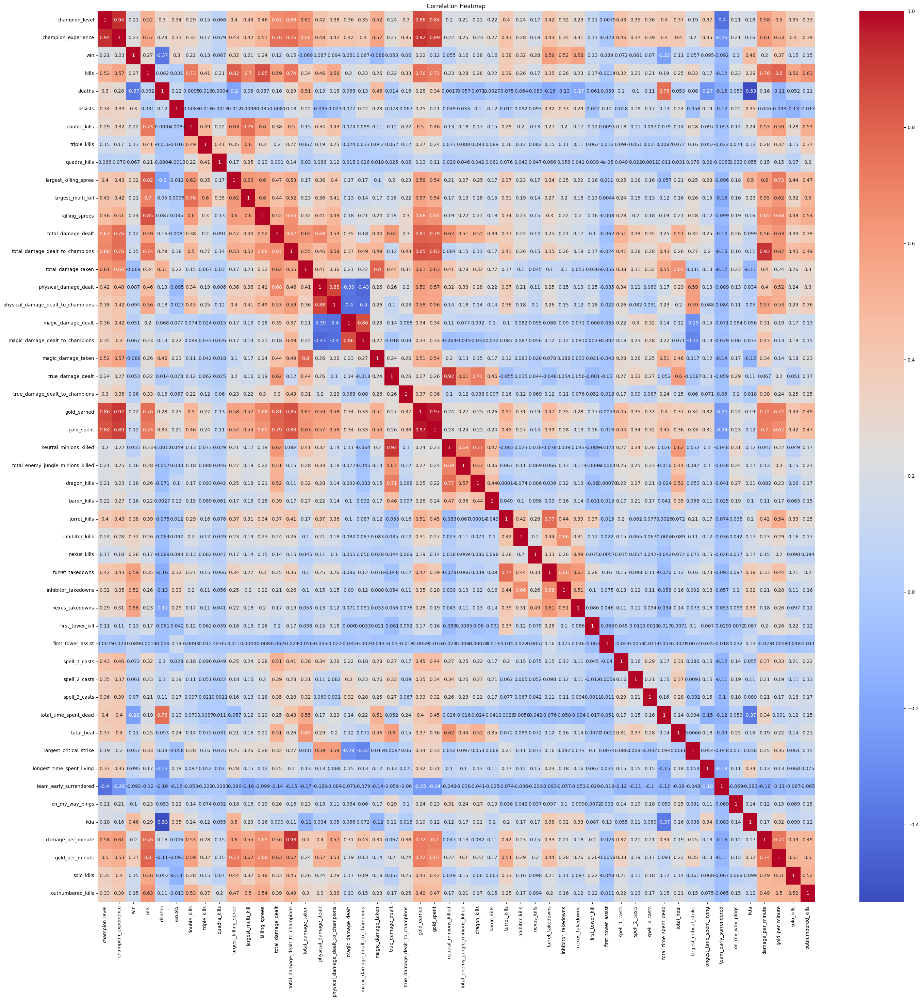

In [37]:
plt.figure(figsize=(34, 34))
sns.heatmap(cleaned_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [38]:
cleaned_df["objective_takedowns"] = cleaned_df["turret_takedowns"] + cleaned_df["inhibitor_takedowns"] + cleaned_df["nexus_takedowns"]
cleaned_df.drop(["turret_takedowns","inhibitor_takedowns","nexus_takedowns"], axis=1, inplace=True)

cleaned_df["epic_monster_kills"] = cleaned_df["dragon_kills"] + cleaned_df["baron_kills"]
cleaned_df.drop(["dragon_kills","baron_kills"], axis=1, inplace=True)

cleaned_df["damage_ratio"] = cleaned_df["total_damage_dealt_to_champions"] / (cleaned_df["total_damage_taken"]+1)

drop_corr = [
    "champion_experience",
    "gold_spent",
    "total_damage_taken",
    "total_damage_dealt_to_champions",
    "true_damage_dealt",
]

cleaned_df = cleaned_df.drop(drop_corr, axis=1)

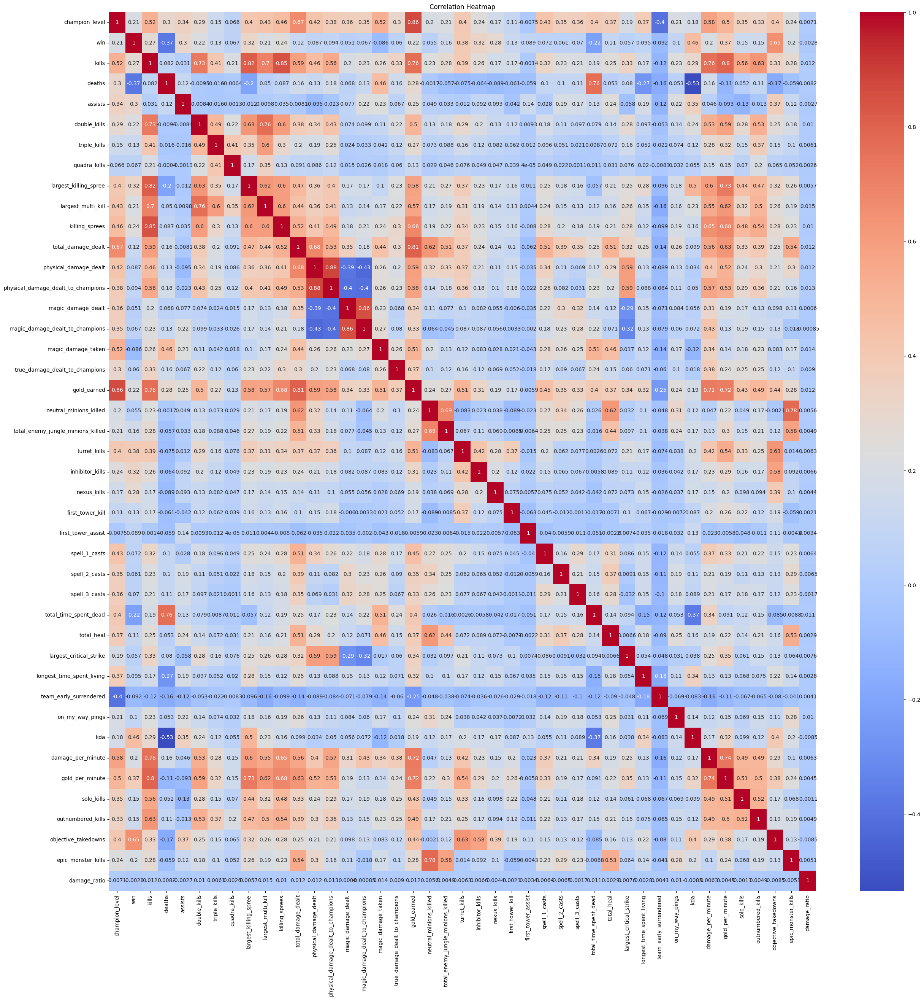

In [39]:
plt.figure(figsize=(30, 30))
sns.heatmap(cleaned_df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

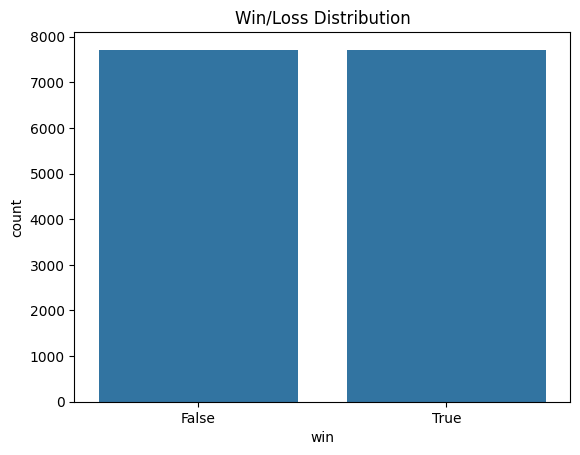

In [40]:
sns.countplot(x='win', data=cleaned_df)
plt.title('Win/Loss Distribution')
plt.show()

In [41]:
# profile = ProfileReport(cleaned_df, title="Pandas Profiling Report", explorative=True)
# profile

# **Binary Classification**

In [42]:
X = cleaned_df.drop('win', axis=1)
y = cleaned_df['win']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [43]:
accuracy_scores = {}
precision_scores = {}
recall_scores = {}
f1_scores = {}

In [44]:
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
accuracy_scores['Logistic Regression'] = accuracy_score(y_test, y_pred)
precision_scores['Logistic Regression'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['Logistic Regression'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['Logistic Regression'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.89      0.93      0.91      1564
        True       0.92      0.88      0.90      1520

    accuracy                           0.91      3084
   macro avg       0.91      0.91      0.91      3084
weighted avg       0.91      0.91      0.91      3084



In [45]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
accuracy_scores['KNN'] = accuracy_score(y_test, y_pred)
precision_scores['KNN'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['KNN'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['KNN'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.84      0.90      0.87      1564
        True       0.89      0.82      0.85      1520

    accuracy                           0.86      3084
   macro avg       0.86      0.86      0.86      3084
weighted avg       0.86      0.86      0.86      3084



In [46]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None] + list(range(1, 11)),
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4]
}

dt = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_dt = grid_search.best_estimator_
print(best_params)

y_pred = best_dt.predict(X_test)
accuracy_scores['Decision Tree'] = accuracy_score(y_test, y_pred)
precision_scores['Decision Tree'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['Decision Tree'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['Decision Tree'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 1, 'min_samples_split': 2}
              precision    recall  f1-score   support

       False       0.86      0.91      0.88      1564
        True       0.90      0.85      0.87      1520

    accuracy                           0.88      3084
   macro avg       0.88      0.88      0.88      3084
weighted avg       0.88      0.88      0.88      3084



In [47]:
rf = RandomForestClassifier(random_state=42, n_estimators=200)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy_scores['Random Forest'] = accuracy_score(y_test, y_pred)
precision_scores['Random Forest'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['Random Forest'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['Random Forest'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.90      0.90      0.90      1564
        True       0.90      0.90      0.90      1520

    accuracy                           0.90      3084
   macro avg       0.90      0.90      0.90      3084
weighted avg       0.90      0.90      0.90      3084



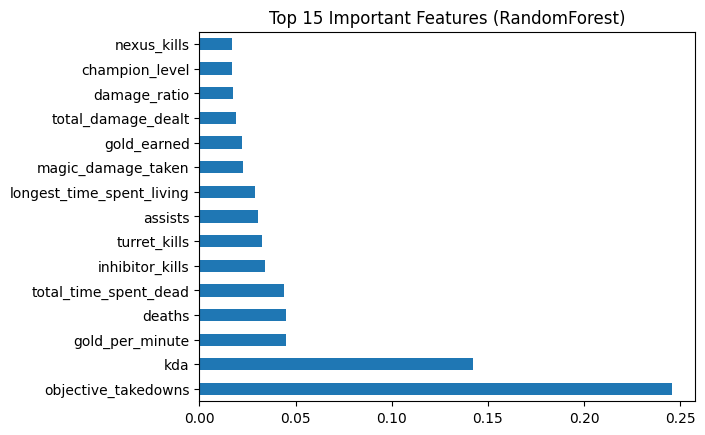

In [48]:
importances = rf.feature_importances_
feat_importances = pd.Series(importances, index=X.columns)
feat_importances.nlargest(15).plot(kind='barh')
plt.title("Top 15 Important Features (RandomForest)")
plt.show()

In [49]:
svc = SVC(random_state=42, kernel='rbf', gamma='scale', C=15)
svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)
accuracy_scores['SVC'] = accuracy_score(y_test, y_pred)
precision_scores['SVC'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['SVC'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['SVC'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.88      0.93      0.91      1564
        True       0.92      0.88      0.90      1520

    accuracy                           0.90      3084
   macro avg       0.90      0.90      0.90      3084
weighted avg       0.90      0.90      0.90      3084



In [50]:
xgb = XGBClassifier(random_state=42, n_estimators=200, max_depth=None, learning_rate=0.2)
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
accuracy_scores['XGBoost'] = accuracy_score(y_test, y_pred)
precision_scores['XGBoost'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['XGBoost'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['XGBoost'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.90      0.91      0.90      1564
        True       0.91      0.89      0.90      1520

    accuracy                           0.90      3084
   macro avg       0.90      0.90      0.90      3084
weighted avg       0.90      0.90      0.90      3084



In [51]:
nn = Sequential([
    Dense(512, activation='relu', input_shape=(X_train.shape[1:])),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(128, activation='relu'),
    Dense(1, activation='sigmoid')
])

nn.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
callback = EarlyStopping(monitor='val_accuracy', patience=10, mode='max', restore_best_weights=True)

In [52]:
history = nn.fit(X_train, y_train, epochs=100, batch_size=32, callbacks=callback, validation_split=0.2)

Epoch 1/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 8s 11ms/step - accuracy: 0.8576 - loss: 0.4216 - val_accuracy: 0.8800 - val_loss: 0.3486
Epoch 2/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9062 - loss: 0.2518 - val_accuracy: 0.8958 - val_loss: 0.2606
Epoch 3/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9135 - loss: 0.2571 - val_accuracy: 0.8987 - val_loss: 0.2706
Epoch 4/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step - accuracy: 0.9187 - loss: 0.2289 - val_accuracy: 0.9039 - val_loss: 0.2528
Epoch 5/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9213 - loss: 0.2191 - val_accuracy: 0.9027 - val_loss: 0.2760
Epoch 6/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.9195 - loss: 0.2060 - val_accuracy: 0.8950 - val_loss: 0.2831
Epoch 7/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - accuracy: 0.9197 - loss: 0.1988 - val_accuracy: 0.8999 - val_loss: 0.2572
Epoch 8/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.9272 - loss: 0.1843 - val_acc

In [53]:
nn_loss, nn_accuracy = nn.evaluate(X_test, y_test)
print(f'Test Loss: {nn_loss}, Test Accuracy: {nn_accuracy}')
accuracy_scores['Neural Network'] = nn_accuracy
y_pred_nn = np.argmax(nn.predict(X_test), axis=1)
precision_scores['Neural Network'] = precision_score(y_test, y_pred_nn, average='weighted')
recall_scores['Neural Network'] = recall_score(y_test, y_pred_nn, average='weighted')
f1_scores['Neural Network'] = f1_score(y_test, y_pred_nn, average='weighted')

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.9093 - loss: 0.2889
Test Loss: 0.28489911556243896, Test Accuracy: 0.9072632789611816
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


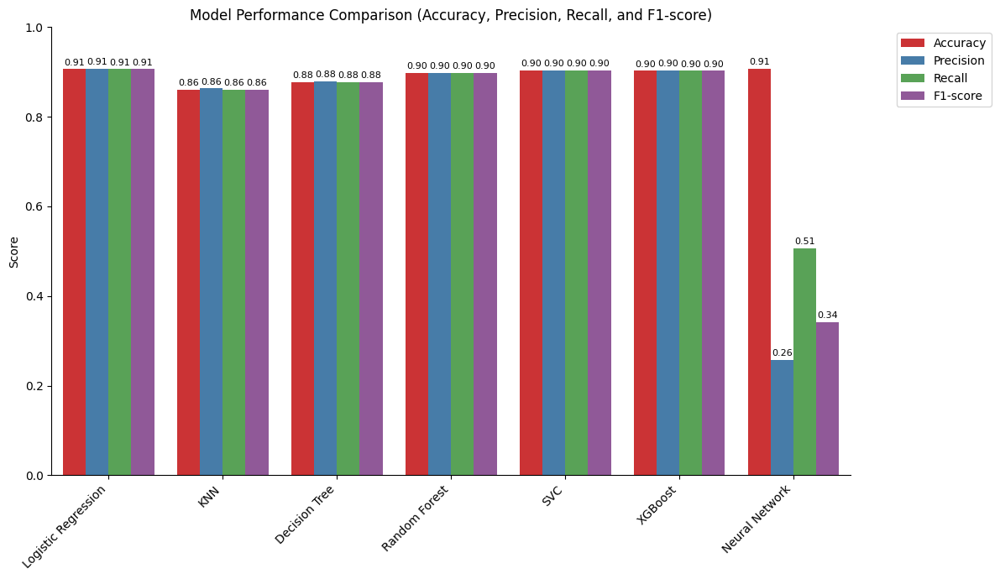

In [54]:
metrics_df = pd.DataFrame({
    'Model': list(accuracy_scores.keys()),
    'Accuracy': list(accuracy_scores.values()),
    'Precision': list(precision_scores.values()),
    'Recall': list(recall_scores.values()),
    'F1-score': list(f1_scores.values())
})

metrics_df_melted = metrics_df.melt(id_vars='Model', var_name='Metric', value_name='Score')

plt.figure(figsize=(12, 7))
ax = sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df_melted, palette='Set1')
plt.title('Model Performance Comparison (Accuracy, Precision, Recall, and F1-score)')
plt.ylabel('Score')
plt.xlabel('')
plt.ylim(0, 1)
plt.xticks(rotation=45, ha='right')

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=2, fontsize=8)

sns.despine(top=True, right=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [87]:
import pandas as pd
results_df = pd.DataFrame({
    "Model": list(accuracy_scores.keys()),
    "Accuracy": list(accuracy_scores.values()),
    "Precision": list(precision_scores.values()),
    "Recall": list(recall_scores.values()),
    "F1-Score": list(f1_scores.values())
})

print(results_df)

import os
os.makedirs("results", exist_ok=True)
results_df.to_csv("results/metrics_comparison.csv", index=False)
print("✅ Saved results/metrics_comparison.csv")


                 Model  Accuracy  Precision    Recall  F1-Score
0  Logistic Regression  0.951038   0.951244  0.951038  0.951115
1                  KNN  0.867380   0.868877  0.867380  0.867426
2        Decision Tree  0.926070   0.925987  0.926070  0.925911
3        Random Forest  0.960441   0.960636  0.960441  0.960436
4                  SVC  0.895914   0.901585  0.895914  0.897092
5              XGBoost  0.965953   0.966254  0.965953  0.966014
6       Neural Network  0.951686   0.953290  0.951686  0.951652
✅ Saved results/metrics_comparison.csv


In [92]:
models = {

    "Logistic Regression": lr,
    "KNN": knn,
    "Decision Tree": dt,
    "Random Forest":rf,
    "SVC":  svc,
    "XGBoost": xgb,
    "Neural Network":nn
}


In [88]:
accuracy_scores

{'Logistic Regression': 0.9510376134889753,
 'KNN': 0.8673800259403373,
 'Decision Tree': 0.9260700389105059,
 'Random Forest': 0.9604409857328146,
 'SVC': 0.8959143968871596,
 'XGBoost': 0.9659533073929961,
 'Neural Network': 0.9516861438751221}

In [94]:
import joblib
import os

os.makedirs("saved_models", exist_ok=True)

for name, model in models.items():   # <-- خلي بالك من .items()
    filename = f"saved_models/{name.replace(' ', '_')}.pkl"
    joblib.dump(model, filename)
    print(f"💾 Saved {name} as {filename}")



💾 Saved Logistic Regression as saved_models/Logistic_Regression.pkl
💾 Saved KNN as saved_models/KNN.pkl
💾 Saved Decision Tree as saved_models/Decision_Tree.pkl
💾 Saved Random Forest as saved_models/Random_Forest.pkl
💾 Saved SVC as saved_models/SVC.pkl
💾 Saved XGBoost as saved_models/XGBoost.pkl
💾 Saved Neural Network as saved_models/Neural_Network.pkl


# **Regression**

In [55]:
cleaned_df = df.copy()

In [56]:
weak_corr = cleaned_df.corr()['gold_earned'].abs().sort_values(ascending=False).where(lambda x: x < 0.05).dropna().index
weak_corr

Index(['lane', 'rune_primary_style', 'objectives_stolen_assists',
       'wards_placed', 'num_of_bans', 'champion_id', 'vision_score',
       'first_blood_assist', 'consumables_purchased', 'team_id',
       'first_tower_assist', 'rune_stat_flex', 'rune_stat_defense',
       'rune_stat_offense', 'queue_id', 'rune_secondary_style'],
      dtype='object')

In [57]:
cleaned_df = cleaned_df.drop(weak_corr, axis=1)

In [58]:
cleaned_df["objective_takedowns"] = cleaned_df["turret_takedowns"] + cleaned_df["inhibitor_takedowns"] + cleaned_df["nexus_takedowns"]
cleaned_df.drop(["turret_takedowns","inhibitor_takedowns","nexus_takedowns"], axis=1, inplace=True)

cleaned_df["epic_monster_kills"] = cleaned_df["dragon_kills"] + cleaned_df["baron_kills"]
cleaned_df.drop(["dragon_kills","baron_kills"], axis=1, inplace=True)

cleaned_df["damage_ratio"] = cleaned_df["total_damage_dealt_to_champions"] / (cleaned_df["total_damage_taken"]+1)

In [59]:
X = cleaned_df.drop('gold_earned', axis=1)
y = cleaned_df['gold_earned']

In [60]:
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X)

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

In [62]:
r2_scores = {}
mae_scores = {}
mse_scores = {}

In [63]:
lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)
y_pred = lin_reg.predict(X_test)
r2_scores['Linear Regression'] = r2_score(y_test, y_pred)
mae_scores['Linear Regression'] = mean_absolute_error(y_test, y_pred)
mse_scores['Linear Regression'] = mean_squared_error(y_test, y_pred)
print(f'R2 Score: {r2_score(y_test, y_pred)}')
print(f'Mean Absolute Error: {mean_absolute_error(y_test, y_pred)}')
print(f'Mean Squared Error: {mean_squared_error(y_test, y_pred)}')

R2 Score: 0.9218743829639436
Mean Absolute Error: 0.16029115943720162
Mean Squared Error: 0.046835092376116


In [64]:
linear_nn = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1:])),
    Dense(256, activation='relu'),
    Dense(512, activation='relu'),
    Dense(128, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(1, activation='linear')
])
linear_nn.compile(optimizer='adam', loss='mean_squared_error', metrics=['r2_score'])
callback = EarlyStopping(monitor='val_r2_score', patience=10, mode='max', restore_best_weights=True)

In [65]:
history = linear_nn.fit(X_train, y_train, epochs=100, batch_size=32, callbacks=callback, validation_split=0.2)

Epoch 1/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 7s 14ms/step - loss: 1413.5701 - r2_score: -2348.5759 - val_loss: 21.4089 - val_r2_score: -33.3788
Epoch 2/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - loss: 115.8857 - r2_score: -187.8575 - val_loss: 0.3411 - val_r2_score: 0.4523
Epoch 3/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.3386 - r2_score: 0.4466 - val_loss: 1.4462 - val_r2_score: -1.3224
Epoch 4/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.8696 - r2_score: -0.5093 - val_loss: 0.2506 - val_r2_score: 0.5975
Epoch 5/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 5.6102 - r2_score: -8.4639 - val_loss: 0.1838 - val_r2_score: 0.7049
Epoch 6/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.2347 - r2_score: 0.6131 - val_loss: 0.2229 - val_r2_score: 0.6420
Epoch 7/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.3092 - r2_score: 0.4845 - val_loss: 0.2314 - val_r2_score: 0.6284
Epoch 8/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 0.2111 - r2_score

In [66]:
linear_nn_loss, linear_nn_r2 = linear_nn.evaluate(X_test, y_test)
print(f'Test Loss: {linear_nn_loss}, Test R2 Score: {linear_nn_r2}')
r2_scores['Neural Network'] = linear_nn_r2
mae_scores['Neural Network'] = mean_absolute_error(y_test, linear_nn.predict(X_test))
mse_scores['Neural Network'] = mean_squared_error(y_test, linear_nn.predict(X_test))

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0933 - r2_score: 0.8471
Test Loss: 0.08914461731910706, Test R2 Score: 0.8512978553771973
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
97/97 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step


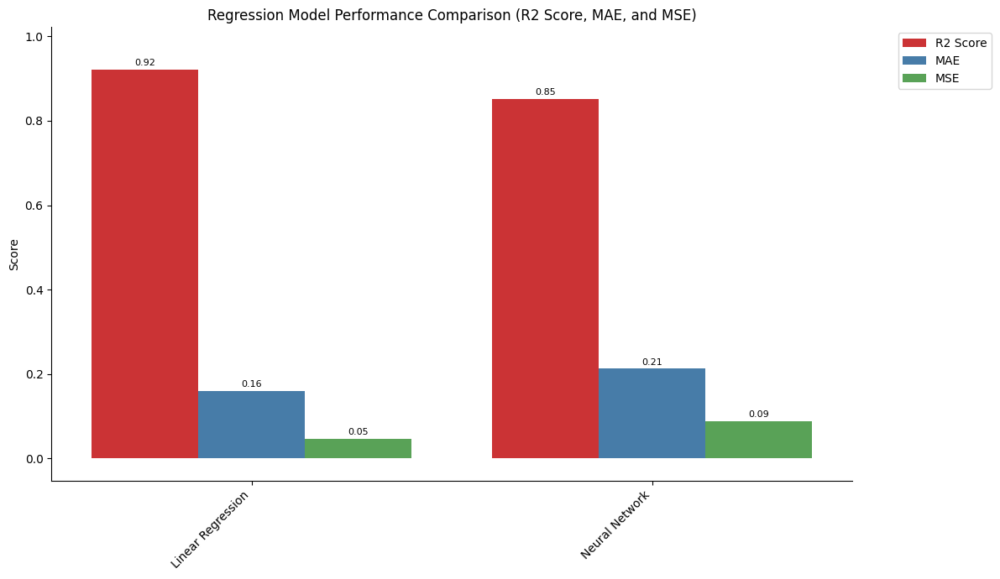

In [67]:
metrics_df_reg = pd.DataFrame({
    'Model': list(r2_scores.keys()),
    'R2 Score': list(r2_scores.values()),
    'MAE': list(mae_scores.values()),
    'MSE': list(mse_scores.values())
})

metrics_df_reg_melted = metrics_df_reg.melt(id_vars='Model', var_name='Metric', value_name='Score')

plt.figure(figsize=(12, 7))
ax = sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df_reg_melted, palette='Set1')
plt.title('Regression Model Performance Comparison (R2 Score, MAE, and MSE)')
plt.ylabel('Score')
plt.xlabel('')
plt.ylim(metrics_df_reg_melted['Score'].min() - 0.1, metrics_df_reg_melted['Score'].max() + 0.1)
plt.xticks(rotation=45, ha='right')

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=2, fontsize=8)

sns.despine(top=True, right=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

In [68]:
cleaned_df = df.copy()

In [69]:
cleaned_df["objective_takedowns"] = cleaned_df["turret_takedowns"] + cleaned_df["inhibitor_takedowns"] + cleaned_df["nexus_takedowns"]
cleaned_df.drop(["turret_takedowns","inhibitor_takedowns","nexus_takedowns"], axis=1, inplace=True)

cleaned_df["epic_monster_kills"] = cleaned_df["dragon_kills"] + cleaned_df["baron_kills"]
cleaned_df.drop(["dragon_kills","baron_kills"], axis=1, inplace=True)

cleaned_df["damage_ratio"] = cleaned_df["total_damage_dealt_to_champions"] / (cleaned_df["total_damage_taken"]+1)

# **Multi Classification**

In [70]:
weak_corr = cleaned_df.corr()['team_position'].abs().sort_values(ascending=False).where(lambda x: x < 0.05).dropna().index
weak_corr

Index(['nexus_kills', 'need_vision_pings', 'total_damage_taken',
       'assist_me_pings', 'spell_4_casts', 'command_pings', 'spell_3_casts',
       'total_time_spent_dead', 'all_in_pings', 'magic_damage_taken',
       'get_back_pings', 'rune_secondary_style', 'first_tower_kill',
       'magic_damage_dealt', 'objectives_stolen_assists', 'push_pings',
       'skillshots_dodged', 'retreat_pings', 'penta_kills',
       'true_damage_dealt_to_champions', 'longest_time_spent_living',
       'damage_ratio', 'solo_kills', 'rune_stat_offense',
       'enemy_missing_pings', 'enemy_vision_pings', 'queue_id',
       'rune_stat_defense', 'rune_stat_flex', 'objective_takedowns', 'kda',
       'total_time_cc_dealt', 'deaths', 'num_of_bans',
       'eligible_for_progression', 'team_id', 'win', 'time_played',
       'game_duration', 'game_ended_in_surrender', 'kill_participation',
       'game_ended_in_early_surrender', 'team_early_surrendered'],
      dtype='object')

In [71]:
cleaned_df = cleaned_df.drop(weak_corr, axis=1)

In [72]:
X = cleaned_df.drop('team_position', axis=1)
y = cleaned_df['team_position']

In [73]:
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X)

In [74]:
X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.2, random_state=42)

In [75]:
accuracy_scores = {}
precision_scores = {}
recall_scores = {}
f1_scores = {}

In [76]:
lr = LogisticRegression(max_iter=1000, random_state=42)
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
accuracy_scores['Logistic Regression'] = accuracy_score(y_test, y_pred)
precision_scores['Logistic Regression'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['Logistic Regression'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['Logistic Regression'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       619
           1       0.99      1.00      0.99       616
           2       0.89      0.90      0.90       611
           3       0.90      0.89      0.90       588
           4       0.99      0.98      0.98       650

    accuracy                           0.95      3084
   macro avg       0.95      0.95      0.95      3084
weighted avg       0.95      0.95      0.95      3084



In [77]:
knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
accuracy_scores['KNN'] = accuracy_score(y_test, y_pred)
precision_scores['KNN'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['KNN'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['KNN'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       619
           1       0.96      0.96      0.96       616
           2       0.77      0.84      0.80       611
           3       0.87      0.79      0.83       588
           4       0.84      0.82      0.83       650

    accuracy                           0.87      3084
   macro avg       0.87      0.87      0.87      3084
weighted avg       0.87      0.87      0.87      3084



In [78]:
param_grid = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [None] + list(range(1, 11)),
    'min_samples_split': [2, 3, 4, 5],
    'min_samples_leaf': [1, 2, 3, 4]
}

dt = DecisionTreeClassifier(random_state=42)
grid_search = GridSearchCV(estimator=dt, param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

best_params = grid_search.best_params_
best_dt = grid_search.best_estimator_
print(best_params)

y_pred = best_dt.predict(X_test)
accuracy_scores['Decision Tree'] = accuracy_score(y_test, y_pred)
precision_scores['Decision Tree'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['Decision Tree'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['Decision Tree'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 3}
              precision    recall  f1-score   support

           0       0.96      0.97      0.97       619
           1       0.97      0.99      0.98       616
           2       0.83      0.85      0.84       611
           3       0.89      0.85      0.87       588
           4       0.96      0.96      0.96       650

    accuracy                           0.93      3084
   macro avg       0.93      0.92      0.92      3084
weighted avg       0.93      0.93      0.93      3084



In [79]:
rf = RandomForestClassifier(random_state=42, n_estimators=200)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
accuracy_scores['Random Forest'] = accuracy_score(y_test, y_pred)
precision_scores['Random Forest'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['Random Forest'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['Random Forest'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       619
           1       0.99      1.00      0.99       616
           2       0.90      0.93      0.92       611
           3       0.94      0.91      0.92       588
           4       0.98      0.99      0.98       650

    accuracy                           0.96      3084
   macro avg       0.96      0.96      0.96      3084
weighted avg       0.96      0.96      0.96      3084



In [80]:
svc = SVC(random_state=42, kernel='rbf', gamma=0.005, C=20)
svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)
accuracy_scores['SVC'] = accuracy_score(y_test, y_pred)
precision_scores['SVC'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['SVC'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['SVC'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.92      0.95       619
           1       0.99      0.92      0.96       616
           2       0.84      0.87      0.85       611
           3       0.88      0.83      0.86       588
           4       0.81      0.94      0.87       650

    accuracy                           0.90      3084
   macro avg       0.90      0.89      0.90      3084
weighted avg       0.90      0.90      0.90      3084



In [81]:
xgb = XGBClassifier(random_state=42, n_estimators=200, max_depth=None, learning_rate=0.2)
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
accuracy_scores['XGBoost'] = accuracy_score(y_test, y_pred)
precision_scores['XGBoost'] = precision_score(y_test, y_pred, average='weighted')
recall_scores['XGBoost'] = recall_score(y_test, y_pred, average='weighted')
f1_scores['XGBoost'] = f1_score(y_test, y_pred, average='weighted')
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.98      0.98       619
           1       0.99      1.00      0.99       616
           2       0.91      0.94      0.93       611
           3       0.95      0.92      0.93       588
           4       0.99      0.99      0.99       650

    accuracy                           0.97      3084
   macro avg       0.97      0.97      0.97      3084
weighted avg       0.97      0.97      0.97      3084



In [82]:
num_classes = len(np.unique(y_train))
nn = Sequential([
    Dense(512, activation='relu', input_shape=(X_train.shape[1:])),
    Dense(512, activation='relu'),
    Dropout(0.2),
    Dense(256, activation='relu'),
    Dropout(0.2),
    Dense(128, activation='relu'),
    Dense(num_classes, activation='softmax')
])

nn.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
callback = EarlyStopping(monitor='val_accuracy', patience=10, mode='max', restore_best_weights=True)

In [83]:
history = nn.fit(X_train, y_train, epochs=100, batch_size=32, callbacks=callback, validation_split=0.2)

Epoch 1/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 12s 21ms/step - accuracy: 0.3009 - loss: 12.8054 - val_accuracy: 0.5063 - val_loss: 2.1659
Epoch 2/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4746 - loss: 1.8709 - val_accuracy: 0.4844 - val_loss: 1.0867
Epoch 3/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5055 - loss: 1.2310 - val_accuracy: 0.6838 - val_loss: 0.7757
Epoch 4/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7026 - loss: 0.7754 - val_accuracy: 0.8427 - val_loss: 0.5456
Epoch 5/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7824 - loss: 0.6084 - val_accuracy: 0.8950 - val_loss: 0.3648
Epoch 6/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8370 - loss: 0.4786 - val_accuracy: 0.8942 - val_loss: 0.3251
Epoch 7/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8405 - loss: 0.4695 - val_accuracy: 0.8780 - val_loss: 0.3496
Epoch 8/100
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.8637 - loss: 0.4052 - val_a

In [84]:
nn_loss, nn_accuracy = nn.evaluate(X_test, y_test)
print(f'Test Loss: {nn_loss}, Test Accuracy: {nn_accuracy}')
accuracy_scores['Neural Network'] = nn_accuracy
y_pred_nn = np.argmax(nn.predict(X_test), axis=1)
precision_scores['Neural Network'] = precision_score(y_test, y_pred_nn, average='weighted')
recall_scores['Neural Network'] = recall_score(y_test, y_pred_nn, average='weighted')
f1_scores['Neural Network'] = f1_score(y_test, y_pred_nn, average='weighted')

97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.9545 - loss: 0.1402
Test Loss: 0.14788123965263367, Test Accuracy: 0.9516861438751221
97/97 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step


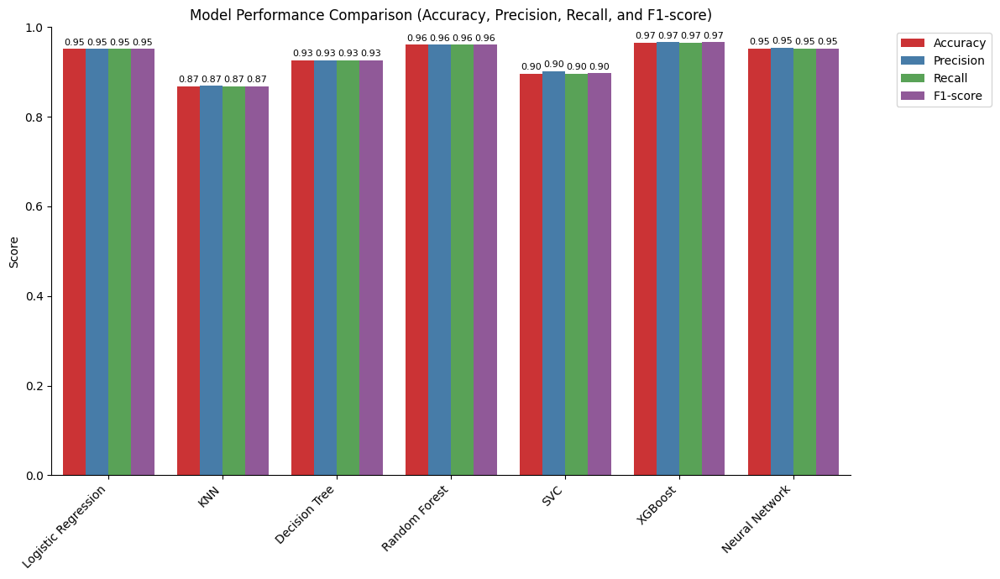

In [85]:
metrics_df = pd.DataFrame({
    'Model': list(accuracy_scores.keys()),
    'Accuracy': list(accuracy_scores.values()),
    'Precision': list(precision_scores.values()),
    'Recall': list(recall_scores.values()),
    'F1-score': list(f1_scores.values())
})

metrics_df_melted = metrics_df.melt(id_vars='Model', var_name='Metric', value_name='Score')

plt.figure(figsize=(12, 7))
ax = sns.barplot(x='Model', y='Score', hue='Metric', data=metrics_df_melted, palette='Set1')
plt.title('Model Performance Comparison (Accuracy, Precision, Recall, and F1-score)')
plt.ylabel('Score')
plt.xlabel('')
plt.ylim(0, 1)
plt.xticks(rotation=45, ha='right')

for container in ax.containers:
    ax.bar_label(container, fmt='%.2f', label_type='edge', padding=2, fontsize=8)

sns.despine(top=True, right=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()